# FlexDamage Visualization

This notebook demonstrates some exampels to generate diagnostics from regressions and additional examples.

In [1]:
import sys
import shutil
import pandas as pd
import numpy as np
import yaml
from pathlib import Path
from IPython.display import Image, display

# Ensure package is discoverable
project_root = Path("../").resolve()
sys.path.insert(0, str(project_root))

# Import the visualizer (consolidated from v2)
from flexdamage.diagnostics.visualizer import DiagnosticVisualizer
from flexdamage.diagnostics.styles import (
    get_style, 
    apply_style, 
    SCIENTIFIC_STYLE, 
    PRESENTATION_STYLE,
    PARAM_LABELS,
    GREEK_STATS
)

# Setup output directory
output_dir = Path("viz_tutorial_output")
if output_dir.exists():
    shutil.rmtree(output_dir)
output_dir.mkdir()

print("Setup complete!")
print(f"Output directory: {output_dir.absolute()}")

Setup complete!
Output directory: /project/cil/home_dirs/scadavidsanchez/projects/ag-flex-damage-functions/flexdamage-dev/notebooks/viz_tutorial_output


## 1. Generate Mock Data

Creating realistic mock data with multiple dimensions (rcp, ssp, gdp) for testing visualizations.

In [2]:
np.random.seed(42)
n = 5000

# Generate mock data with all required dimensions
df_data = pd.DataFrame({
    "region": np.random.choice([f"REG_{i:02d}" for i in range(25)], n),
    "year": np.random.randint(2000, 2100, n),
    "rcp": np.random.choice(["rcp45", "rcp85"], n),
    "ssp": np.random.choice(["SSP2", "SSP3", "SSP5"], n),
    "temperature_anomaly": np.random.uniform(-2, 8, n),
    "lgdp_delta": np.random.normal(0, 0.3, n),
    "pop": np.random.uniform(1e5, 1e7, n),
})

# Generate mortality impact with realistic parameters
true_alpha = -0.03
true_beta = 0.02
true_gamma = -0.01

df_data["mortality_impact"] = (
    true_alpha * df_data["temperature_anomaly"] +
    true_beta * df_data["temperature_anomaly"]**2 +
    true_gamma * df_data["lgdp_delta"] +
    np.random.normal(0, 0.08, n)
)

print(f"Generated {len(df_data)} records with columns:")
print(df_data.columns.tolist())
df_data.head()

Generated 5000 records with columns:
['region', 'year', 'rcp', 'ssp', 'temperature_anomaly', 'lgdp_delta', 'pop', 'mortality_impact']


,region,year,rcp,ssp,temperature_anomaly,lgdp_delta,pop,mortality_impact
0,REG_06,2079,rcp85,SSP5,-0.313963,-0.056779,6.304527e+06,0.200364
1,REG_19,2066,rcp85,SSP2,5.912977,-0.156561,9.336999e+06,0.552613
2,REG_14,2029,rcp85,SSP2,4.483731,0.342185,9.579830e+06,0.367573
3,REG_10,2056,rcp85,SSP2,3.698255,0.086538,6.009165e+06,0.262934
4,REG_07,2085,rcp45,SSP2,-0.323780,-0.538571,2.968815e+05,0.071998


In [3]:
# Generate mock regional results
regions = df_data["region"].unique()
n_regions = len(regions)

df_results = pd.DataFrame({
    "region": regions,
    "n": np.random.randint(50, 200, n_regions),
    "alpha": np.random.normal(-0.03, 0.02, n_regions),
    "beta": np.abs(np.random.normal(0.02, 0.01, n_regions)),  # Convex
    "rsqr1": np.random.uniform(0.1, 0.9, n_regions),
    "rsqr2": np.random.uniform(0.1, 0.9, n_regions),
    "zeta": np.random.uniform(0.01, 0.1, n_regions),
    "eta": np.random.uniform(0.05, 0.3, n_regions),
    "s2": np.random.uniform(0.01, 0.05, n_regions),
    "rho": np.zeros(n_regions),
})

# Generate mock global results
global_results = {
    "gamma": -0.008,
    "se": 0.002,
    "diagnostics": {
        "year": df_data["year"].values[:1000],
        "residuals": np.random.normal(0, 0.05, 1000),
        "ssp": df_data["ssp"].values[:1000],
        "rcp": df_data["rcp"].values[:1000],
    }
}

print(f"Generated results for {n_regions} regions")
df_results.head()

Generated results for 25 regions


,region,n,alpha,beta,rsqr1,rsqr2,zeta,eta,s2,rho
0,REG_06,91,-0.037562,0.026366,0.663616,0.634928,0.014673,0.203652,0.044901,0.0
1,REG_19,184,-0.054082,0.043361,0.452227,0.297641,0.077347,0.107578,0.012252,0.0
2,REG_14,67,-0.046810,0.009778,0.802710,0.588364,0.053045,0.169831,0.036111,0.0
3,REG_10,52,-0.040535,0.007816,0.210149,0.424017,0.074906,0.062779,0.025087,0.0
4,REG_07,69,-0.067183,0.017550,0.308271,0.608280,0.082826,0.220153,0.018134,0.0


## 2. Style System

The new visualization system provides two professional themes:

- **`scientific`**: Clean, publication-ready (default)
- **`presentation`**: Slightly bolder for slides/reports

Both follow Tufte principles:
- Maximize data-ink ratio
- Remove unnecessary elements
- Use purposeful color

In [4]:
# Explore available styles
print("=== SCIENTIFIC STYLE ===")
print(f"Primary color: {SCIENTIFIC_STYLE.colors.primary}")
print(f"Mean indicator: {SCIENTIFIC_STYLE.colors.mean_color}")
print(f"Median indicator: {SCIENTIFIC_STYLE.colors.median_color}")

print("\n=== PRESENTATION STYLE ===")
print(f"Primary color: {PRESENTATION_STYLE.colors.primary}")
print(f"Mean indicator: {PRESENTATION_STYLE.colors.mean_color}")

=== SCIENTIFIC STYLE ===
Primary color: #2C3E50
Mean indicator: #C0392B
Median indicator: #2980B9

=== PRESENTATION STYLE ===
Primary color: #1A1A2E
Mean indicator: #E94560


## 3. Initialize Visualizer

In [5]:
# Initialize with scientific style (default)
visualizer = DiagnosticVisualizer(output_dir, style="scientific")
print(f"Visualizer initialized with '{visualizer.style.name}' style")

Visualizer initialized with 'scientific' style


## 4. NEW: Relationship Plots (Temperature/Economic vs Damages)

These are general-purpose plots for exploring relationships with ggplot-style regression overlays.

### 4.1 Temperature vs Damage Relationship

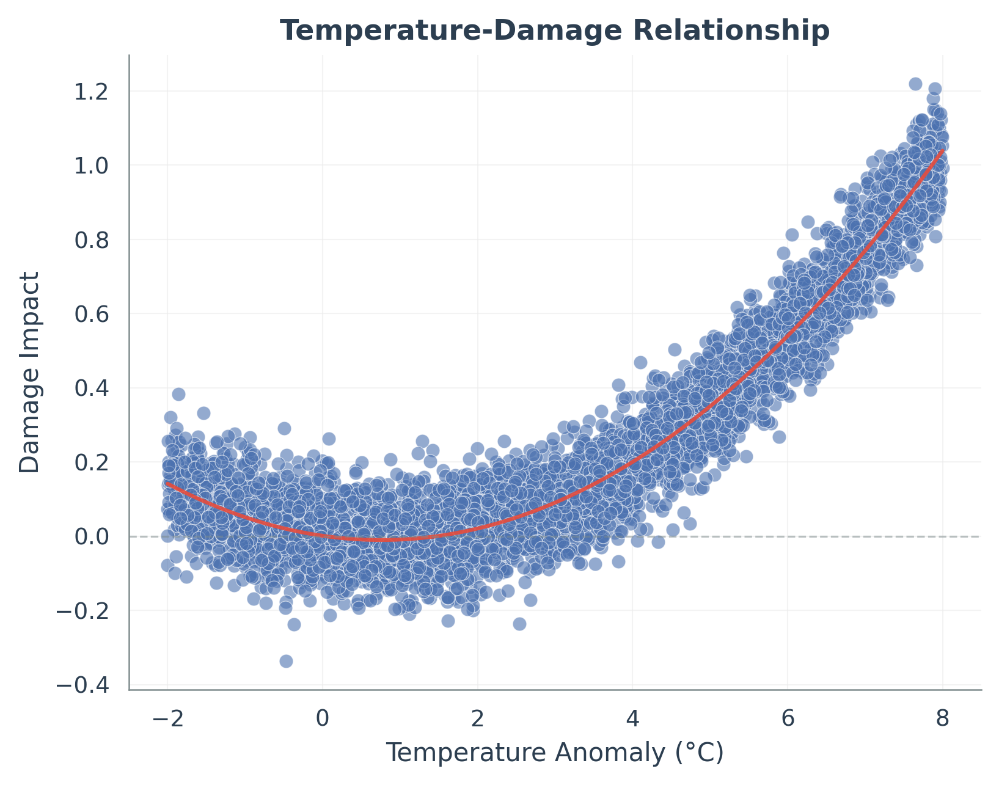

In [6]:
# Basic temperature-damage relationship with LOWESS regression
out_path = visualizer.plot_temperature_damage(
    df_data,
    temp_col="temperature_anomaly",
    damage_col="mortality_impact",
    add_regression=True,
    regression_type="lowess",
)
if out_path:
    display(Image(filename=out_path))

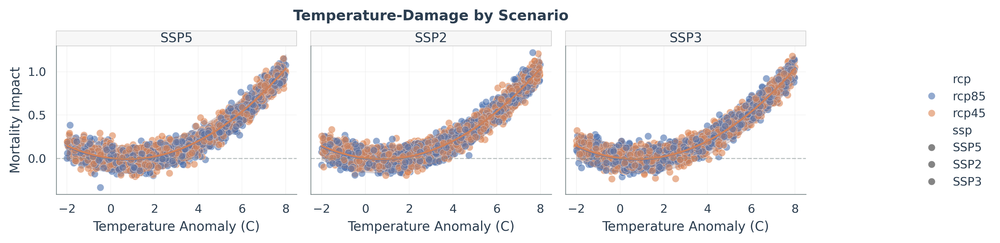

In [7]:
# Temperature-damage with color by RCP, shape by SSP, AND faceted by SSP
# FIX: Added facet_col to show panels for each SSP
out_path = visualizer.plot_relationship(
    df_data,
    x_col="temperature_anomaly",
    y_col="mortality_impact",
    color_col="rcp",           # Color by RCP scenario
    shape_col="ssp",           # Shape by SSP scenario
    facet_col="ssp",           # FIX: Facet by SSP for clearer view
    add_regression=True,
    regression_type="polynomial",
    polynomial_degree=2,
    ci=95,
    xlabel="Temperature Anomaly (C)",
    ylabel="Mortality Impact",
    title="Temperature-Damage by Scenario",
    filename="temp_damage_by_scenario.png"
)
if out_path:
    display(Image(filename=out_path))

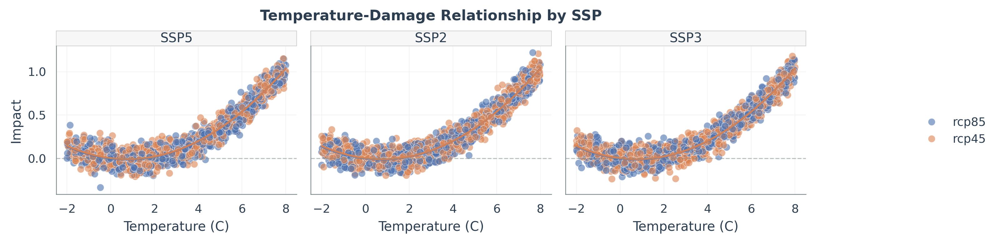

In [8]:
# Faceted by SSP, colored by RCP
out_path = visualizer.plot_relationship(
    df_data,
    x_col="temperature_anomaly",
    y_col="mortality_impact",
    color_col="rcp",
    facet_col="ssp",           # Facet horizontally by SSP
    add_regression=True,
    regression_type="lowess",
    xlabel="Temperature (C)",
    ylabel="Impact",
    title="Temperature-Damage Relationship by SSP",
    filename="temp_damage_faceted_ssp.png"
)
if out_path:
    display(Image(filename=out_path))

### 4.2 Economic Variable vs Damage Relationship

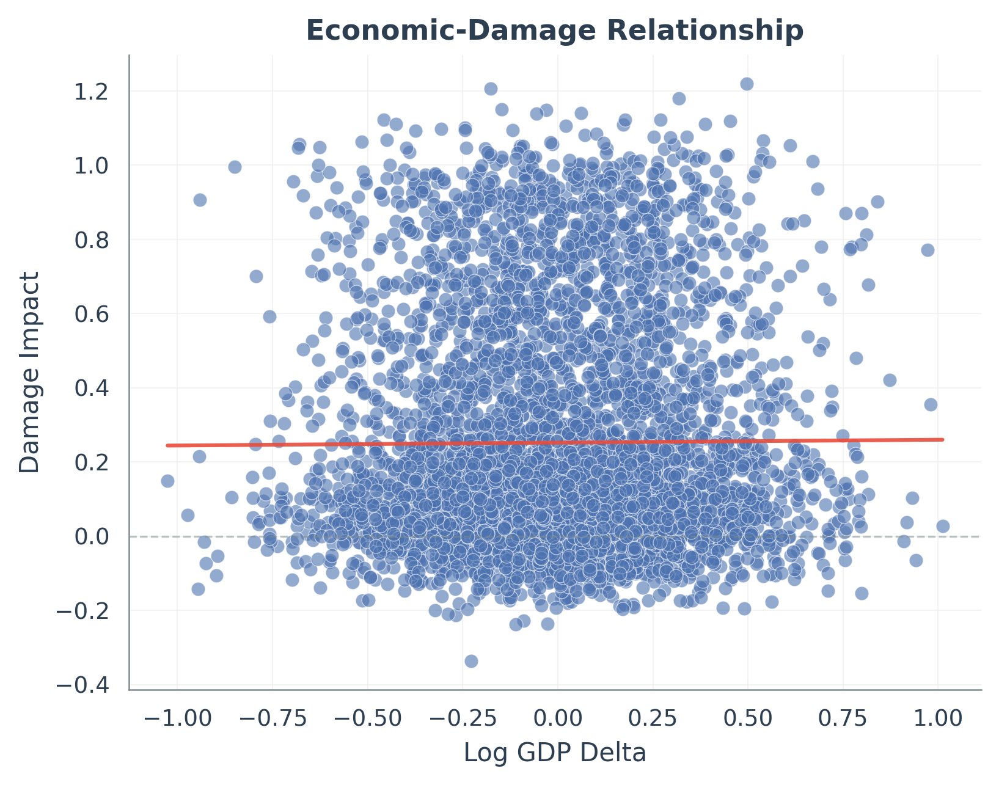

In [9]:
# Economic variable vs damage with linear regression
# FIX: Removed CI (set ci=None) - only show the regression line
out_path = visualizer.plot_economic_damage(
    df_data,
    econ_col="lgdp_delta",
    damage_col="mortality_impact",
    add_regression=True,
    regression_type="linear",
    ci=None,  # FIX: No confidence interval, just the line
)
if out_path:
    display(Image(filename=out_path))

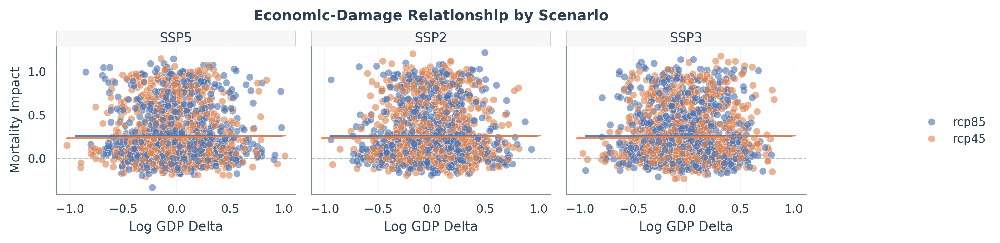

In [10]:
# Economic vs damage colored by RCP, faceted by SSP
# FIX: No confidence intervals (ci=None)
out_path = visualizer.plot_relationship(
    df_data,
    x_col="lgdp_delta",
    y_col="mortality_impact",
    color_col="rcp",
    facet_col="ssp",
    add_regression=True,
    regression_type="linear",
    ci=None,  # FIX: No confidence interval
    xlabel="Log GDP Delta",
    ylabel="Mortality Impact",
    title="Economic-Damage Relationship by Scenario",
    filename="econ_damage_by_scenario.png"
)
if out_path:
    display(Image(filename=out_path))

## 5. Parameter Distributions

**FIX**: 3x2 layout with stats table below, no main title.

**NEW**: Use `show_table=True` (default) to display stats table, or `show_table=False` to hide it.

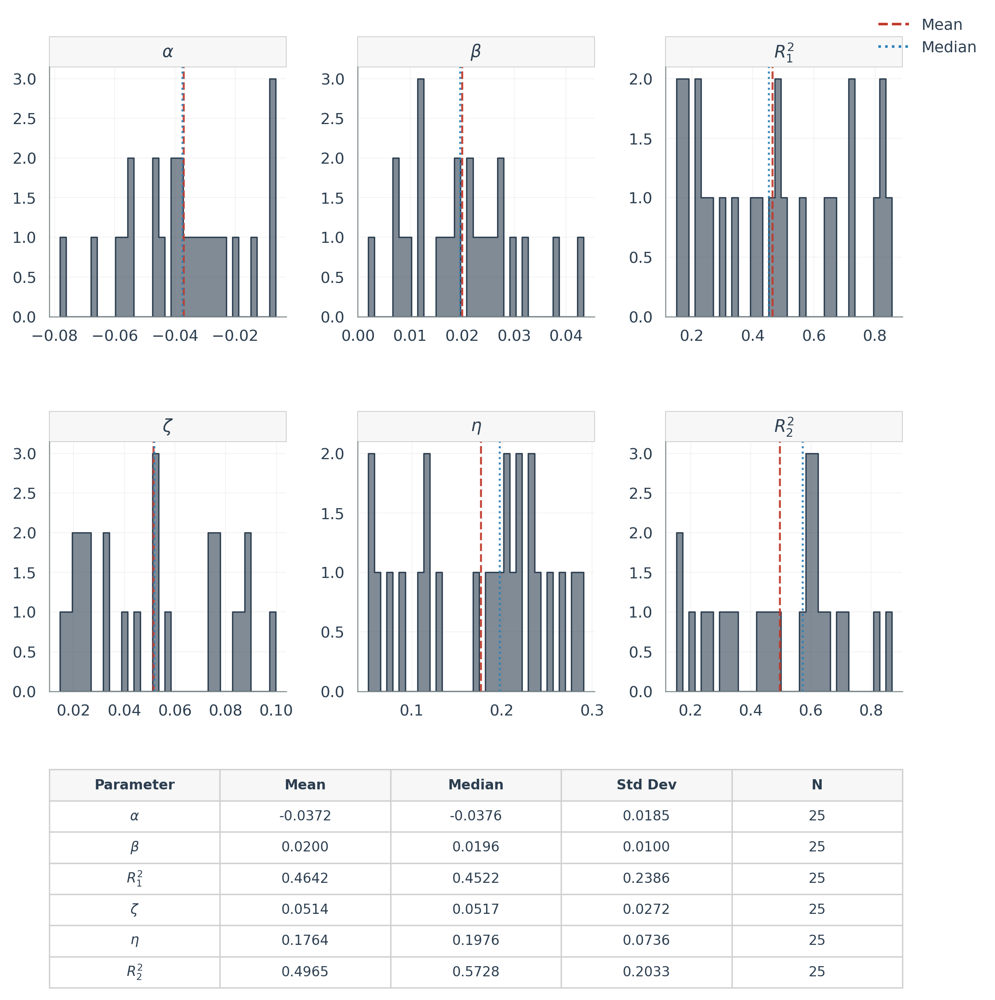

In [11]:
# Parameter distributions with stats table (default)
# FIX: Table no longer overlaps with panels - proper spacing applied
out_path = visualizer.plot_parameter_distributions(df_results, show_table=True)
if out_path:
    display(Image(filename=out_path))

# You can also hide the table:
# out_path = visualizer.plot_parameter_distributions(df_results, show_table=False)

## 6. Crossing Zero Plot

**FIX**: Integrated legend with colored values (Mean in red, Median in blue), no Greek symbols.

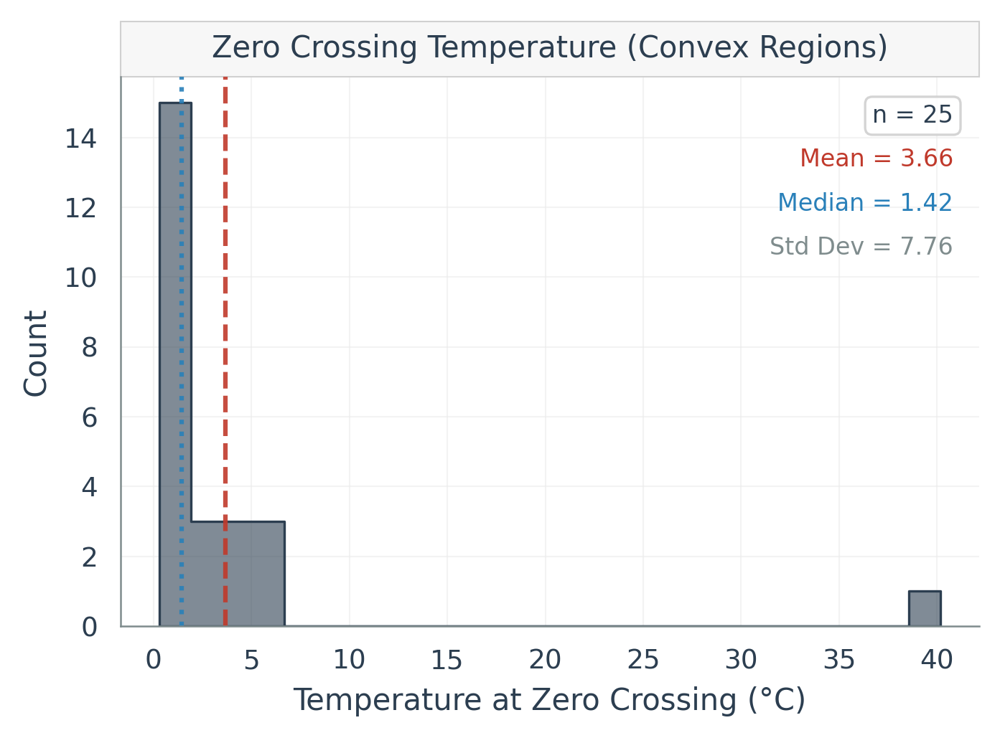

In [12]:
out_path = visualizer.plot_crossing_zero(df_results)
if out_path:
    display(Image(filename=out_path))

## 7. Maximum Slope Plot

**FIX**: Same integrated legend with colored values, with tighter spacing between statistics.

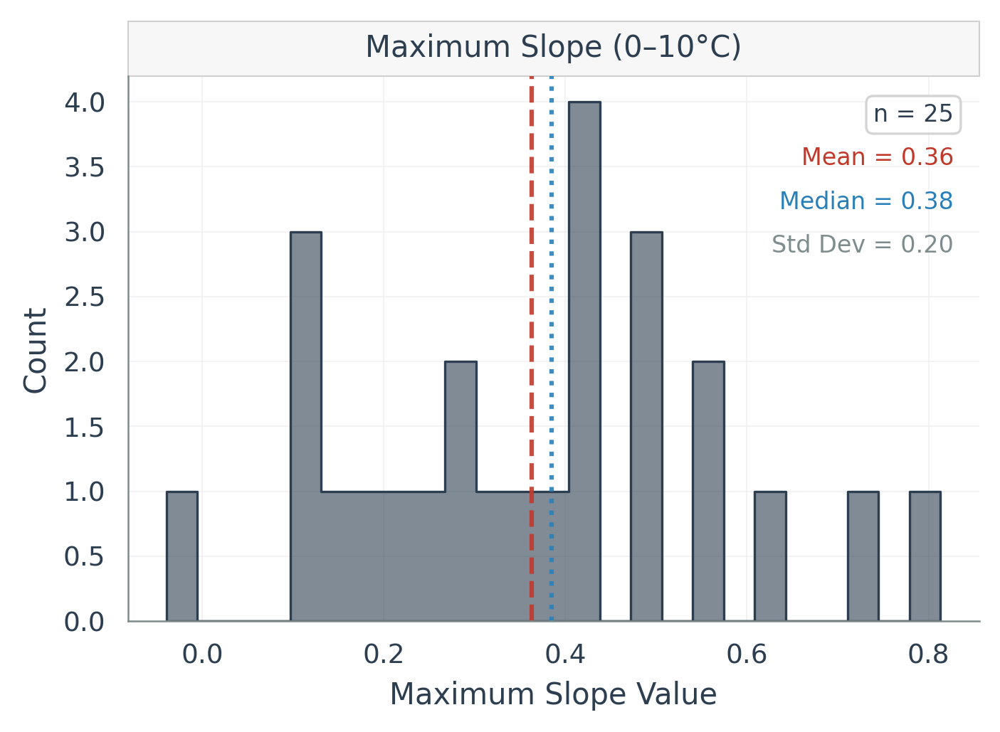

In [13]:
out_path = visualizer.plot_max_slope(df_results, t_range=(0, 10))
if out_path:
    display(Image(filename=out_path))

## 8. Worst Offenders with Observed vs Fitted

**FIX**: Now shows both observed data points AND fitted curve for comparison.

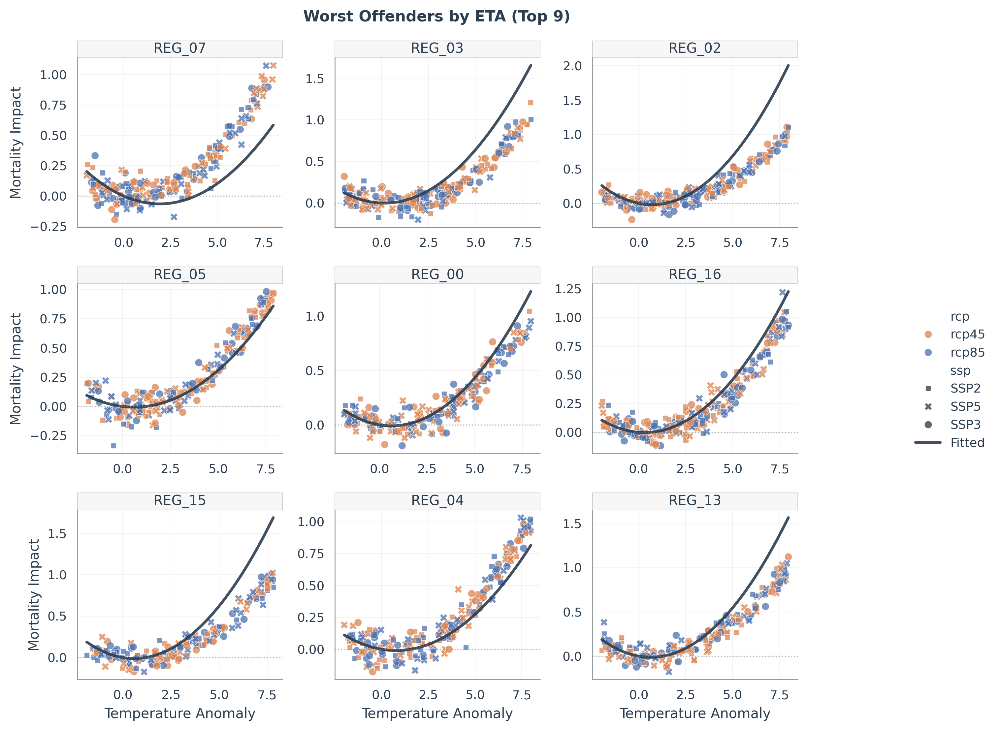

In [14]:
out_path = visualizer.plot_worst_offenders(
    df_results=df_results,
    df_data=df_data,
    x_col="temperature_anomaly",
    y_col="mortality_impact",
    color_col="rcp",
    shape_col="ssp",
    criteria="eta",
    n_regions=9,
    region_col="region",
    show_fit=True,        # Show fitted curve
    show_observed=True    # Show observed points
)
if out_path:
    display(Image(filename=out_path))

## 9. Residuals Diagnostic with Dimensions

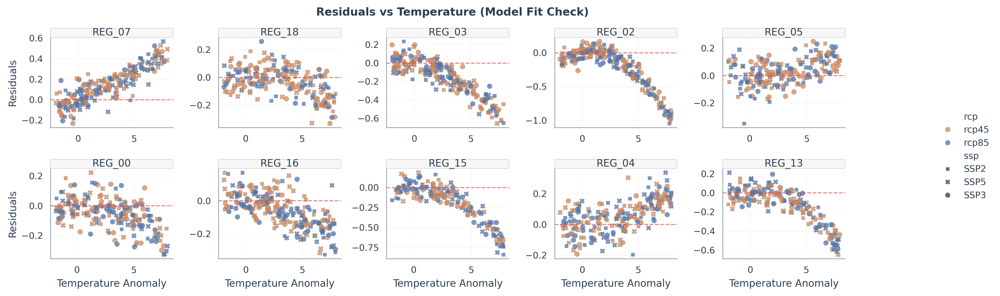

In [15]:
out_path = visualizer.plot_residuals_diagnostic(
    df_results=df_results,
    df_data=df_data,
    x_col="temperature_anomaly",
    y_col="mortality_impact",
    gamma=global_results["gamma"],
    regions=visualizer.select_worst_regions(df_results, "eta", 10),
    region_col="region",
    color_col="rcp",
    shape_col="ssp"
)
if out_path:
    display(Image(filename=out_path))

## 10. Global Residuals

**FIX**: Added horizontal zero reference line for checking model behavior.

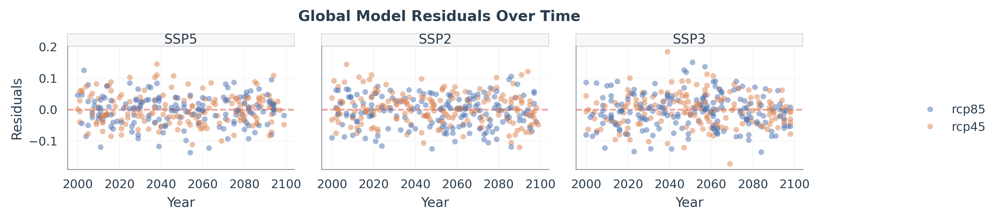

In [16]:
out_path = visualizer.plot_global_residuals(
    global_results,
    facet_col="ssp",
    color_col="rcp"
)
if out_path:
    display(Image(filename=out_path))

## 11. Gamma Distribution

**FIX**: Better x-axis formatting for small decimals (no overlapping).

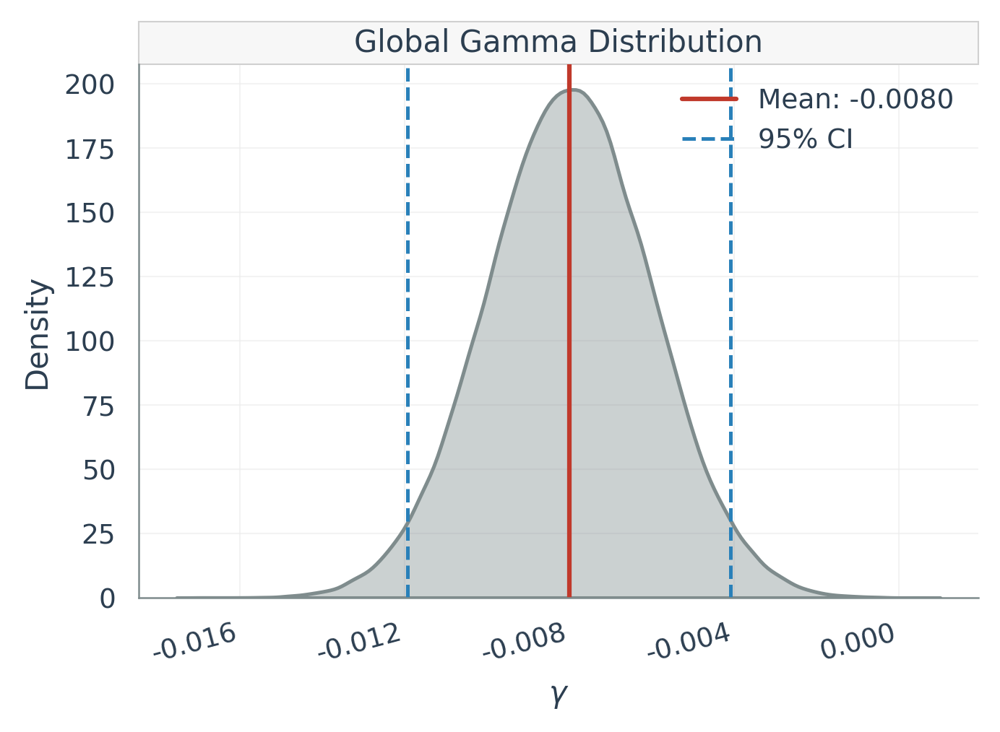

In [17]:
out_path = visualizer.plot_gamma_distribution(global_results)
if out_path:
    display(Image(filename=out_path))

## 12. Polynomial Summary

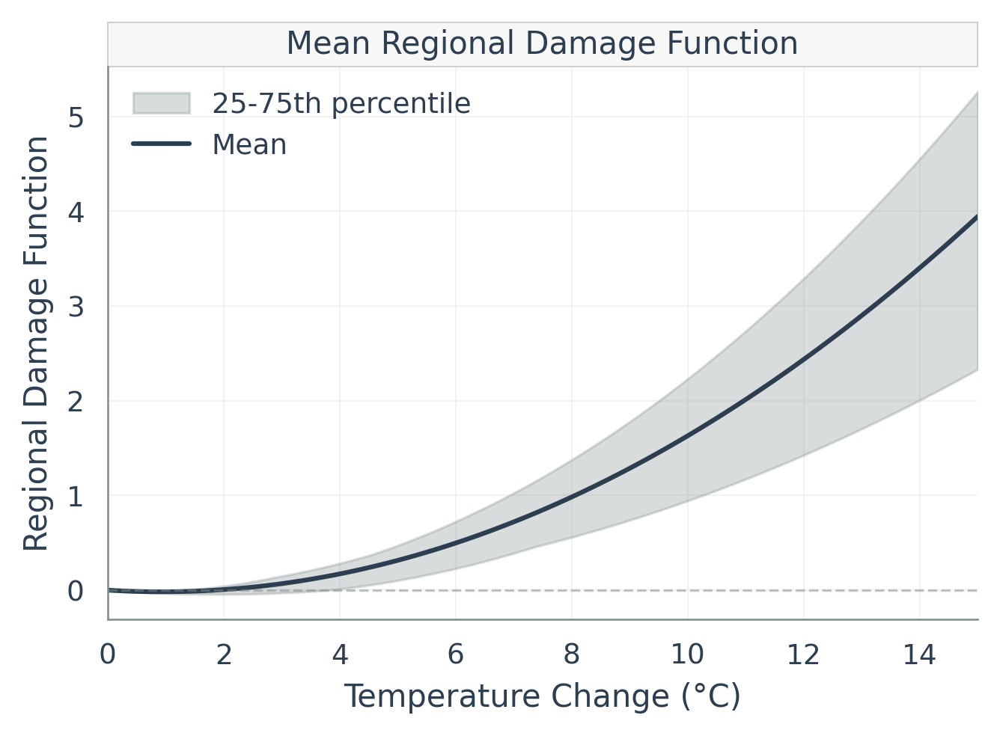

In [18]:
out_path = visualizer.plot_polynomial_summary(df_results, t_range=(0, 15))
if out_path:
    display(Image(filename=out_path))

## 13. Fit Diagnostics

**FIX**: Now shows observed data points AND a smooth fitted curve line (not scattered predicted points).

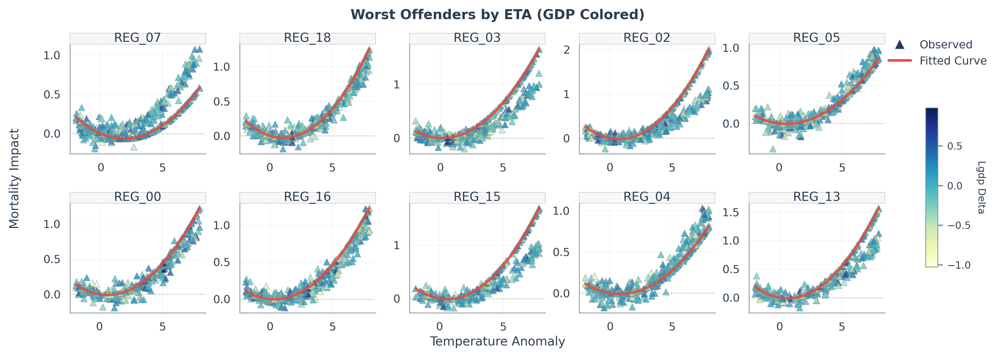

In [19]:
worst_regions = visualizer.select_worst_regions(df_results, "eta", 10)

# FIX: show_curve=True now plots a smooth fitted curve line (not scatter points)
out_path = visualizer.plot_fit_diagnostics(
    df_results=df_results,
    df_data=df_data,
    x_col="temperature_anomaly",
    y_col="mortality_impact",
    gamma=global_results["gamma"],
    color_col="lgdp_delta",
    regions=worst_regions,
    n_cols=5,
    region_col="region",
    show_curve=True,  # Shows fitted polynomial curve as a line
    title="Worst Offenders by ETA (GDP Colored)"
)
if out_path:
    display(Image(filename=out_path))

## 14. Generated Files

In [20]:
print("=== Generated Files ===")
for f in sorted(output_dir.rglob("*.png")):
    rel_path = f.relative_to(output_dir)
    size_kb = f.stat().st_size / 1024
    print(f"  {rel_path}: {size_kb:.1f} KB")

=== Generated Files ===
  crossing_zero.png: 84.0 KB
  econ_damage_by_scenario.png: 987.3 KB
  economic_damage_relationship.png: 933.8 KB
  fit_diagnostics_10.png: 779.6 KB
  gamma_distribution.png: 95.1 KB
  global_residuals_time.png: 345.6 KB
  maxslope_hist.png: 78.8 KB
  param_distributions.png: 195.7 KB
  polynomial_summary.png: 113.9 KB
  residuals_diagnostic.png: 945.8 KB
  temp_damage_by_scenario.png: 655.7 KB
  temp_damage_faceted_ssp.png: 647.8 KB
  temperature_damage_relationship.png: 694.9 KB
  worst_offenders_detail.png: 943.9 KB


## Notes

#### Relationship Plots (`plot_relationship`, `plot_temperature_damage`, `plot_economic_damage`)
- General-purpose X vs Y relationship visualization
- **Regression types**: `linear`, `lowess`, `polynomial`
- **Confidence intervals**: Optional CI bands (set `ci=None` to disable)
- **Multi-dimensional**: `color_col`, `shape_col`, `facet_col`, `facet_row`
- **Customizable**: Labels, title, point size, alpha

6. **Gamma Distribution**: Fixed x-axis decimal overlap

### Usage Examples

```python
from flexdamage.diagnostics.visualizer_v2 import DiagnosticVisualizer

viz = DiagnosticVisualizer(output_dir, style="scientific")

# Temperature vs Damage with regression (no CI)
viz.plot_temperature_damage(
    df, 
    temp_col="temperature_anomaly",
    damage_col="mortality_impact",
    regression_type="polynomial",
    polynomial_degree=2,
    ci=None  # No confidence interval
)

# General relationship with dimensions and faceting
viz.plot_relationship(
    df,
    x_col="temperature_anomaly",
    y_col="mortality_impact",
    color_col="rcp",
    shape_col="ssp",
    facet_col="ssp",  # Facet by SSP
    add_regression=True,
    regression_type="lowess"
)

# Parameter distributions with/without table
viz.plot_parameter_distributions(df_results, show_table=True)  # With table
viz.plot_parameter_distributions(df_results, show_table=False)  # Without table
```